In [193]:
# Include libraries / packages required
#--------------------------------------------
using DifferentialEquations;

using ArgParse; # Argument parsing

# Benchmarking & profiling packages
using BenchmarkTools;
using StatProfilerHTML;

# Visualization packages
using DataFrames;
using Plots;
using Gadfly;
using Cairo;

In [194]:
# Include source files
#--------------------------------------------
# include("ConstantParams.jl");
include("ReactionRates3_old2.jl");
include("HelperFunctions_old.jl");

# include("ODE_Receptor3.jl");
include("ODE_NFkB2.jl");
include("ODE_Apoptosis2_old.jl");
include("ODE_Differentiation.jl");
include("ODE_Proliferation2_old.jl"); # CHANGED this to ODE_Proliferation_old.jl from ODE_Proliferation2_old.jl

include("SimulateFunctionsHaricRel2.jl");

In [195]:
# Define standard reaction rates
#--------------------------------------------
const IKBE_MOD = 0; # 0 for KO and 1 for WT
const MycRepression = true;
# const MycRepression = false;

rates = Matrix{Float64}(undef, GEN72, TOTAL_PARAMS); # CHANGED
setAllRates!(rates);
const Srates = rates;

In [196]:
# Define ODEs for network
#--------------------------------------------
# time-independent ODE (pre-simulation: phase = 1, only receptor & NFkB needs steady state simulation)
function computeNetworkNettFluxes!(nettFlux, concentration, (Srates, reactionFlux), time)
    # computeReceptorNettFluxes!(nettFlux, concentration, reactionFlux, Srates, 1);
    computeNFkBNettFluxes!(nettFlux, concentration, reactionFlux, Srates, 1);
    # computeProlifNettFluxes!(nettFlux, concentration, reactionFlux, Srates, 1); # CHANGED to prestimulation to vary cMyc SS level
    nothing
end

function computeNetworkNettFluxes_AP1!(nettFlux, concentration, (Srates, reactionFlux), time)
    # computeApoptosisNettFluxes!(nettFlux, concentration, reactionFlux, Srates, 1);
    computeProlifNettFluxes!(nettFlux, concentration, reactionFlux, Srates, 1);
    nothing
end

# time-dependent ODE (simulation, w/ delay: phase = 2)
function computeNetworkNettFluxes!(nettFlux, concentration, delay, (birthday, IKKCurve, Srates, reactionFlux, historicFlux), time)
    # computeReceptorNettFluxes!(nettFlux, concentration, reactionFlux, Srates, 2, time);
    computeNFkBNettFluxes!(nettFlux, concentration, delay, reactionFlux, Srates, 2, time, birthday, IKKCurve, historicFlux)
    # computeNFkBNettFluxes!(nettFlux, concentration, reactionFlux, Srates, 2, delay, historicFlux, time);
    # computeDiffNettFluxes!(nettFlux, concentration, reactionFlux, Srates, 2);
    nothing
end

function computeNetworkNettFluxes_AP2!(nettFlux, concentration, (birthday, Srates, reactionFlux, inputCurves), time)
    computeApoptosisNettFluxes!(nettFlux, concentration, reactionFlux, Srates, 2, time, birthday, inputCurves);
    computeProlifNettFluxes!(nettFlux, concentration, reactionFlux, Srates, 2);
    nothing
end

computeNetworkNettFluxes_AP2! (generic function with 1 method)

In [197]:
# Callback function to detect cell death, mitotic and differentiation events
#----------------------------------------------------------------------
function condition(out, u, t, integrator)
    out[1] = u[CPARP] - 2500;
    out[2] = u[CDH1] - 0.2;
    # out[3] = u[IRF4] - 0.65*u[BCL6] - 1.2;
    # out[4] = t - CD40L_DELAY;
end

function affect!(integrator, index)
    if (index == 1)
        if (integrator.u[DEATH_TIME] == 0) # death time
            integrator.u[DEATH_TIME] = integrator.t;
        end
    end
    if (index == 2)
        if (integrator.u[CYCB] > 2.0)
            integrator.u[MASS] /= 2.0;
            integrator.u[GEN] += 1.0; # generation (ignoring cell death)
            # if (integrator.u[DEATH_TIME] == 0) # cell is not dead
            #     integrator.u[TOTAL_SPECIES] += 1.0; # generation (considering cell death)
            # end # CHANGED removed
            if (integrator.u[DIV0_TIME] == 0) # 1st division
                integrator.u[DIV0_TIME] = integrator.t;
            end
            if (integrator.t <= 24) # CHANGED added
                integrator.u[GEN72] += 1.0;
                integrator.u[GEN48] += 1.0;
                integrator.u[GEN24] += 1.0;
            elseif (integrator.t <= 48)
                integrator.u[GEN72] += 1.0;
                integrator.u[GEN48] += 1.0;
            elseif (integrator.t <= 72)
                integrator.u[GEN72] += 1.0;
            end
        end
    # elseif (index == 3)
    #     integrator.u[TOTAL_SPECIES] = 3;
    #     terminate!(integrator);
    # elseif (index == 4)
    #     integrator.u[CD40L] = CD40L_DOSE;
    #     integrator.u[ANTIGEN] = 0;
        # integrator.u[ABCR] = 0;
    end
    nothing
end

cellFate = VectorContinuousCallback(condition, affect!, nothing, 2, save_positions=(false, false));

In [198]:
# Define default delay functions (t < tau)
#--------------------------------------------
# const delay(historicFlux, p, t) = (historicFlux .= 0.0);
const delay(p, t; idxs=nothing) = typeof(idxs) <: Number ? 0.0 : zeros(GEN72); # CHANGED
historicFlux = zeros(Float64, GEN72);
reactionFlux = zeros(Float64, GEN72, TOTAL_PARAMS);
reactionFlux[:,REPRESSION] .= 1;
nettFlux = zeros(Float64, GEN72);

In [199]:
Bcell = ODEProblem(computeNetworkNettFluxes!, (@view Srates[1:end, INITIALCONC]), (0.0, 800.0), (Srates, reactionFlux));
solution = solve(Bcell, method, abstol=abserr, reltol=relerr, save_everystep=false, saveat = 0.1, maxiters=1e7);

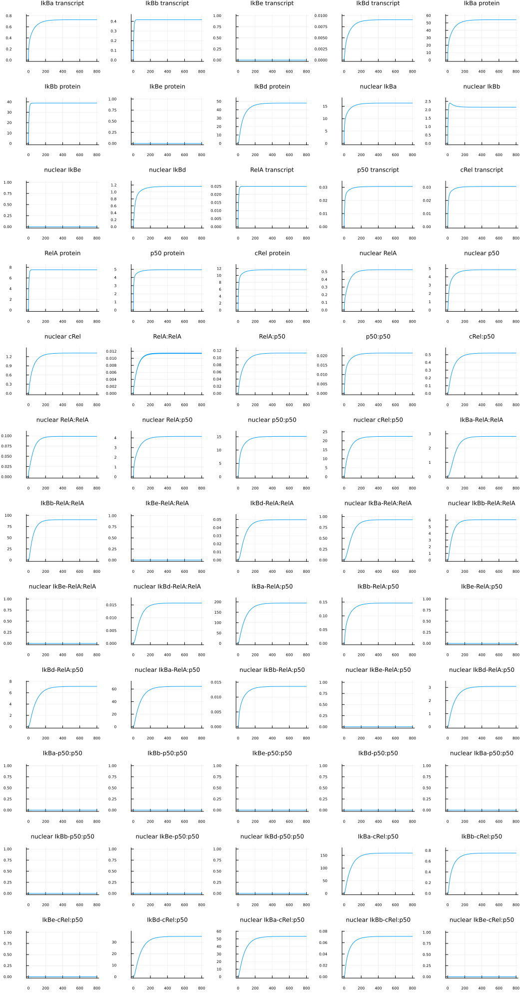

In [200]:
#----------------------------------------------------------------------
# Plot / overlay graphs for each param set
plotArray = Any[];
for species = 2:61
    # p = Plots.plot(NFkBsolution.t, NFkBsolution[species,:], size=(120,200), xlim=(startTime, endTime), legend=false, title=speciesNames[species], titlefontsize=10, xlabel="", ylabel="");
    p = Plots.plot(solution.t, solution[species,:], size=(120,200), xlim=(0.0, 800.0), ylim=(0, (1.1*(findmax(solution[species,:])[1]))), legend=false, title=speciesNames[species], titlefontsize=10, xlabel="", ylabel="");
    push!(plotArray, p);
end
using Plots.PlotMeasures
Plots.plot(plotArray..., size=(1050,2000), layout = (12, 5), left_margin=20Plots.px, xtickfont=(5), ytickfont=(5), xticks = ([0:200:800;]), titlefontsize=8, widen=true)

In [201]:
const IKKCurve = specifyIKKCurve(IKK_shape = IKK_TYPE);

In [202]:
Bcell = SteadyStateProblem(computeNetworkNettFluxes!, (@view Srates[1:end, INITIALCONC]), p=(Srates, reactionFlux));
solution = solve(Bcell, DynamicSS(method, tspan=BURN_IN_PERIOD), abstol=abserr, reltol=relerr, maxiters=1e7);
initialConcentration = solution.u;

In [203]:
Bcell2 = SteadyStateProblem(computeNetworkNettFluxes_AP1!, initialConcentration, p=(Srates, reactionFlux));
solution = solve(Bcell2, DynamicSS(method, tspan=91), abstol=abserr, reltol=relerr, maxiters=1e7);
initialConcentration[1:E2F] = solution.u[1:E2F]; # CHANGED to include only initial proliferation species

In [204]:
Bcell = DDEProblem(computeNetworkNettFluxes!, initialConcentration, delay, (0.0, 72.0), (0, IKKCurve, Srates, reactionFlux, historicFlux); constant_lags=[0.25, 0.75, 1.0, 4.0, 12.0]);
NFkBsolution = solve(Bcell, MethodOfSteps(method), callback=cellFate, abstol=abserr, reltol=relerr, save_everystep=false, saveat = 0.1, maxiters=1e10);

In [205]:
Bcell2 = ODEProblem(computeNetworkNettFluxes_AP2!, initialConcentration, (0.0, 72.0), (0, Srates, reactionFlux, NFkBsolution));
solution = solve(Bcell2, method, callback=cellFate, abstol=abserr, reltol=relerr, save_everystep=false, saveat = 0.1, maxiters=1e10);

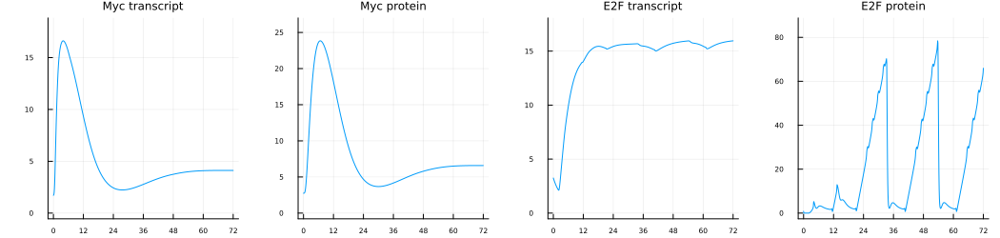

In [206]:
#----------------------------------------------------------------------
# Plot / overlay graphs for each param set
plotArray = Any[];
for species = TMYC:E2F
    # p = Plots.plot(NFkBsolution.t, NFkBsolution[species,:], size=(120,200), xlim=(startTime, endTime), legend=false, title=speciesNames[species], titlefontsize=10, xlabel="", ylabel="");
    p = Plots.plot(solution.t, solution[species,:], size=(120,200), xlim=(0.0, 72.0), ylim=(0, (1.1*(findmax(solution[species,:])[1]))), legend=false, title=speciesNames[species], titlefontsize=10, xlabel="", ylabel="");
    push!(plotArray, p);
end
using Plots.PlotMeasures
Plots.plot(plotArray..., size=(1050,250), layout = (1, 4), left_margin=20Plots.px, xtickfont=(5), ytickfont=(5), xticks = ([0:12:72;]), titlefontsize=8, widen=true)

In [208]:
savefig("/home/helen/CREL_ABUNDANCE_PROJECT2/figures/cRel_Myc_tuning91KO.png") 

"/home/helen/CREL_ABUNDANCE_PROJECT2/figures/cRel_Myc_tuning91KO.png"